In [1]:
import numpy as np
import loompy
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import matplotlib.pyplot as plt
import glob
import bbknn
import seaborn as sns
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.1 (python 3.7.6) on 2020-10-16 10:00.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [2]:
sc.settings.set_figure_params(dpi=70)

In [3]:
adata3 = sc.read_loom(
   'F:\Sequence\ImportantREnvironments\FinalEnvironments\P21Wound.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

adata4 = sc.read_loom(
   'F:\Sequence\ImportantREnvironments\FinalEnvironments\P22Wound.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

adata5 = sc.read_loom(
   'F:\Sequence\ImportantREnvironments\FinalEnvironments\P23Wound.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
adata3.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata4.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata5.var_names_make_unique()  # this is unnecessary if using 'gene_ids'



In [5]:
adata = adata3.concatenate(adata4,adata5, batch_key='batch', batch_categories=['batch4','batch5','batch6'])

#adatap21w = adata6.concatenate(adata7,adata8, batch_key='batch', batch_categories=['batch7','batch8','batch9'])

#adata = adatap2w.concatenate(adatap21w, batch_key='Time', batch_categories=['P2Wound','P21Wound'])

In [6]:
adata

AnnData object with n_obs × n_vars = 21530 × 31045
    obs: 'Clusters', '_X', '_Y', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [8]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [9]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


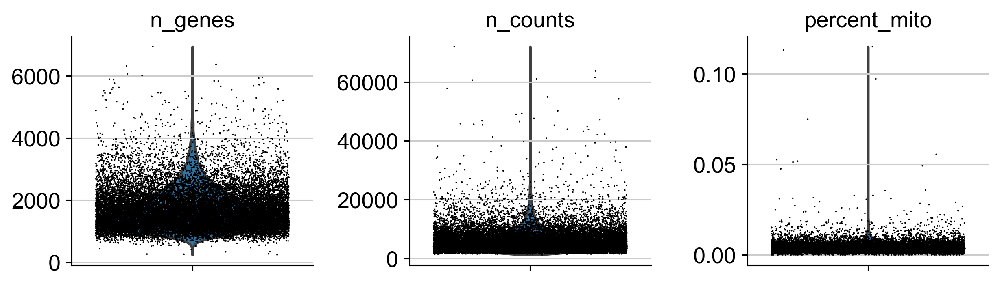

In [10]:
sc.pl.violin(adata, ['n_genes', 'n_counts','percent_mito'],
             jitter=0.4, multi_panel=True)

In [ ]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [12]:
adata

AnnData object with n_obs × n_vars = 21406 × 19186
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [13]:
adata = adata[adata.obs.n_genes < 6000, :]
adata = adata[adata.obs.percent_mito < 0.05, :]

In [14]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

Trying to set attribute `.obs` of view, copying.


In [15]:
sc.pp.log1p(adata)

In [16]:
adata.raw = adata

In [17]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

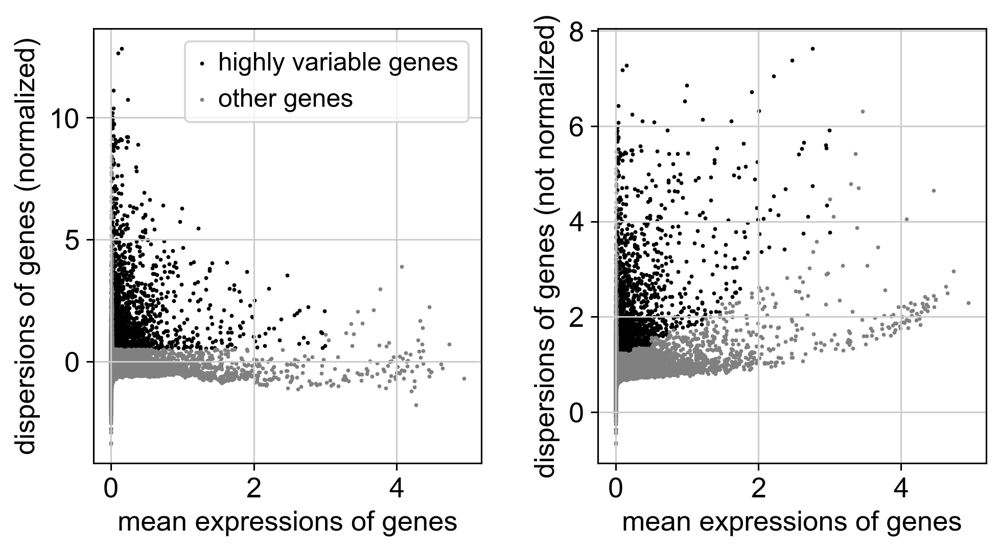

In [18]:
sc.pl.highly_variable_genes(adata)

In [19]:
adata = adata[:, adata.var['highly_variable']]

In [20]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

In [21]:
sc.pp.scale(adata, max_value=10)

In [22]:
sc.tl.pca(adata, svd_solver='arpack')

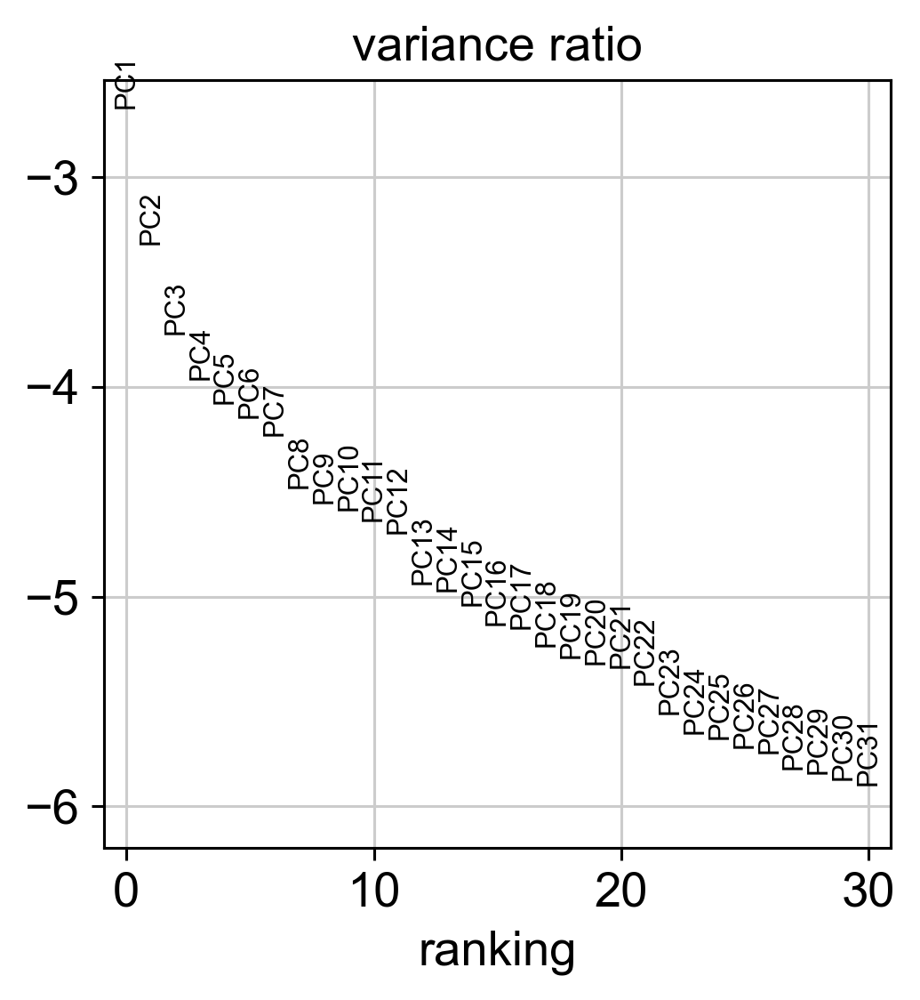

In [24]:
sc.pl.pca_variance_ratio(adata, log=True)

In [25]:
adata

AnnData object with n_obs × n_vars = 21393 × 1941
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [26]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [27]:
sc.tl.umap(adata)

In [28]:
marker_genes = ['Krt14', 'Krt15','Krt17','Krt79','Tyrobp','Lyz2','Ptprc','Dct',
                'Vim','Pdgfra','Twist2','En1','Inhba','Plp1','Mbp','Rgs5','Acta2',
                'Pecam1','Shh'
                 ]

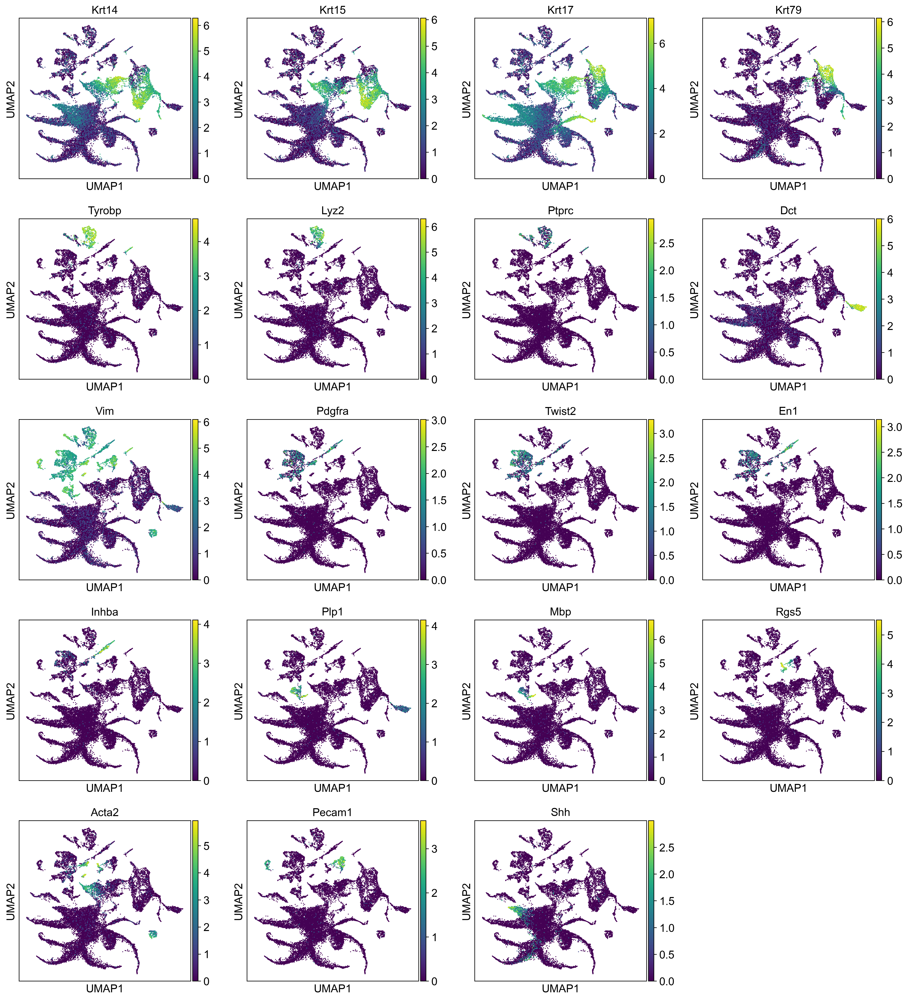

In [29]:
sc.pl.umap(adata, color=marker_genes)

In [30]:
sc.tl.leiden(adata, resolution=0.1)

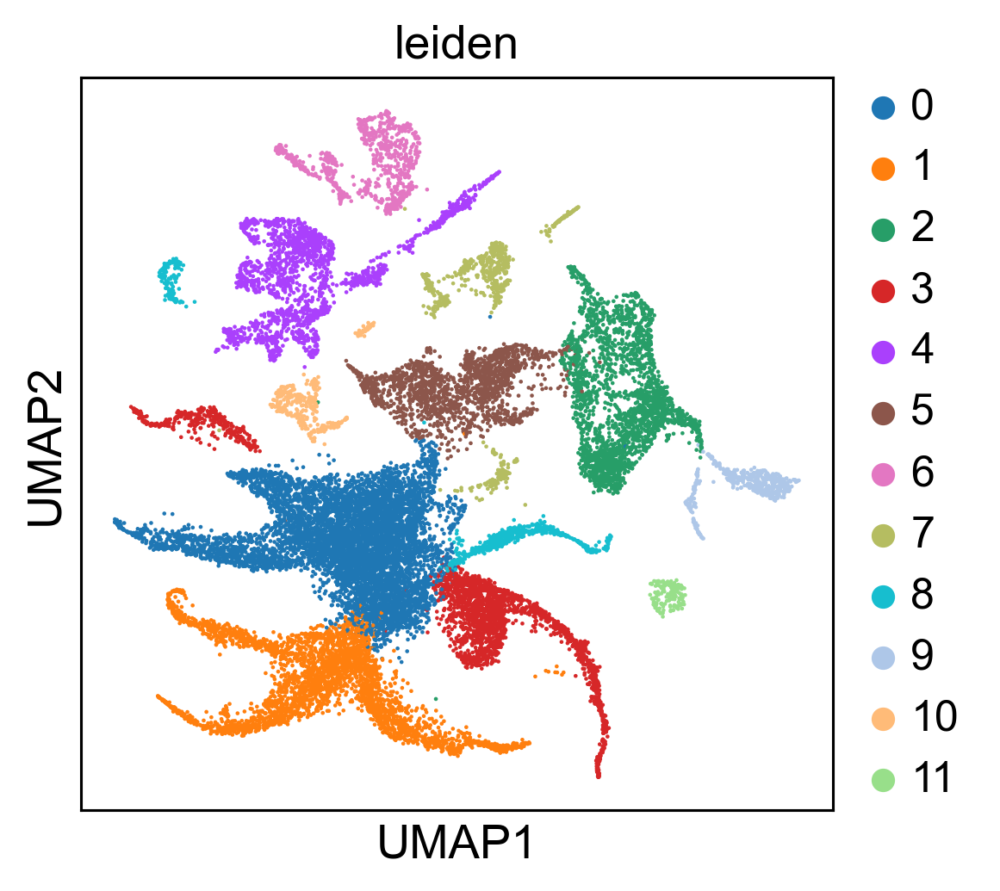

In [31]:
sc.pl.umap(adata, color=['leiden'], legend_loc='right margin', wspace=0.35)

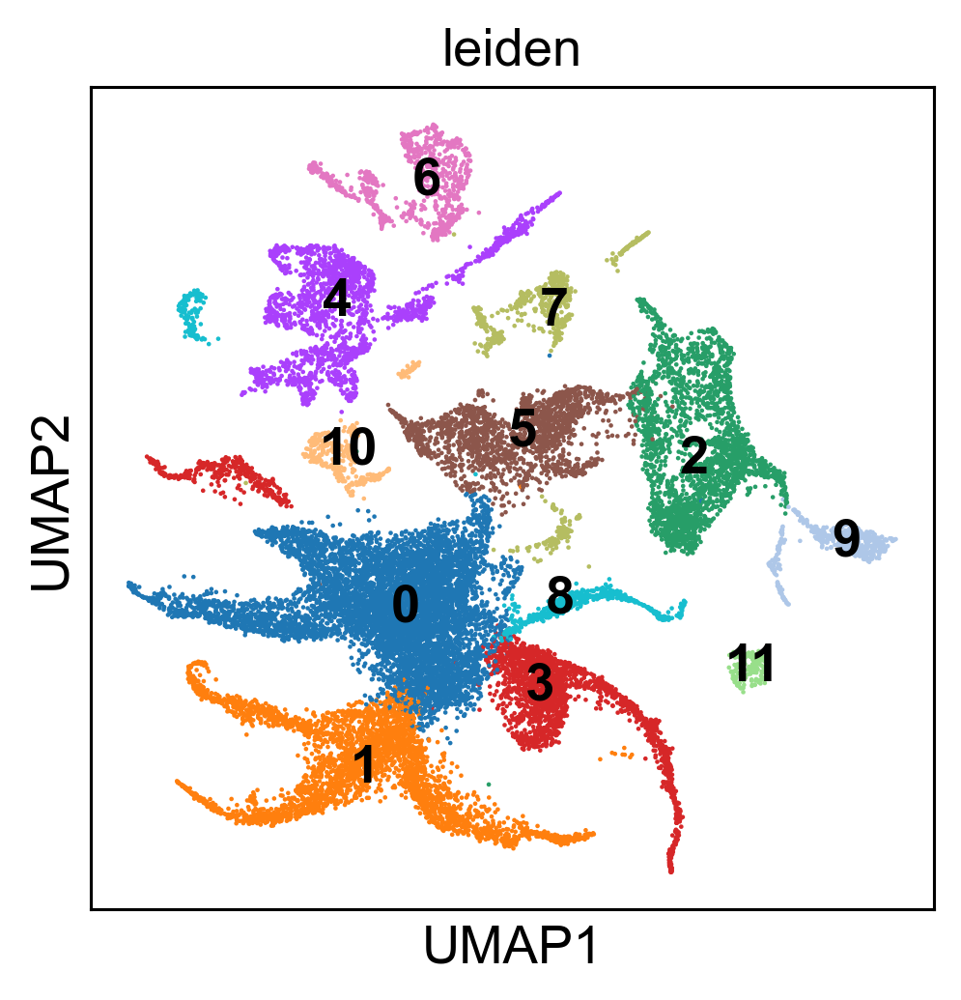

In [32]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', wspace=0.35)

In [33]:
#####SUBSETTING THE DATA#####

In [34]:
adata_subset = adata[adata.obs['leiden'].isin(
    ['4'])]

In [35]:
adata_subset

View of AnnData object with n_obs × n_vars = 1814 × 1941
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [36]:
#bdata = bbknn.bbknn(adata_subset, batch_key='Time', copy=True)

In [37]:
sc.tl.pca(adata_subset, svd_solver='arpack')

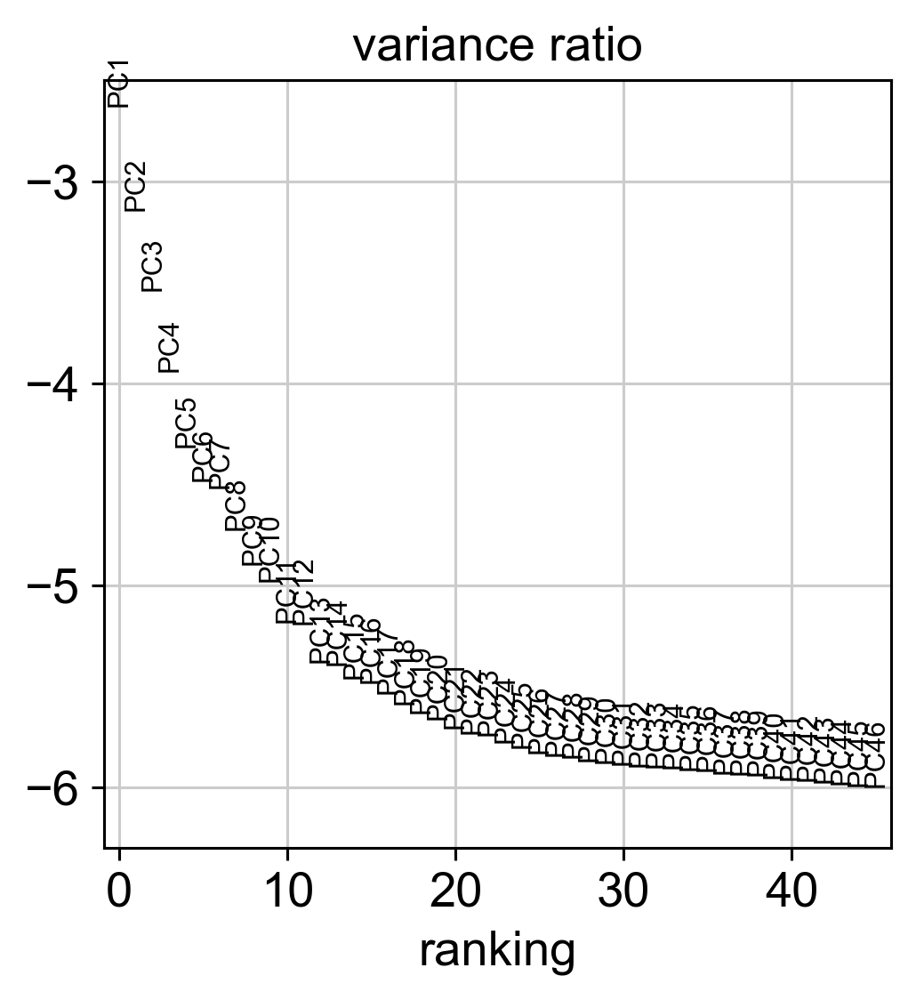

In [39]:
sc.pl.pca_variance_ratio(adata_subset, n_pcs=45, log=True)

In [40]:
##sc.pp.combat(adata_subset, key='Time')

In [41]:
sc.pp.neighbors(adata_subset)#, n_neighbors=15, n_pcs=20

In [42]:
sc.tl.umap(adata_subset)

In [43]:
#sc.tl.umap(adata_subset)

In [44]:
sc.tl.leiden(adata_subset)

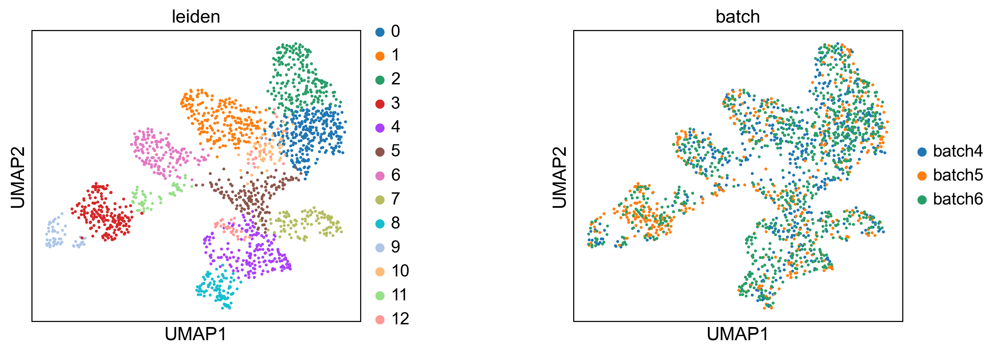

In [45]:
sc.pl.umap(adata_subset, color=['leiden','batch'], legend_loc='right margin', wspace=0.5, size=20)

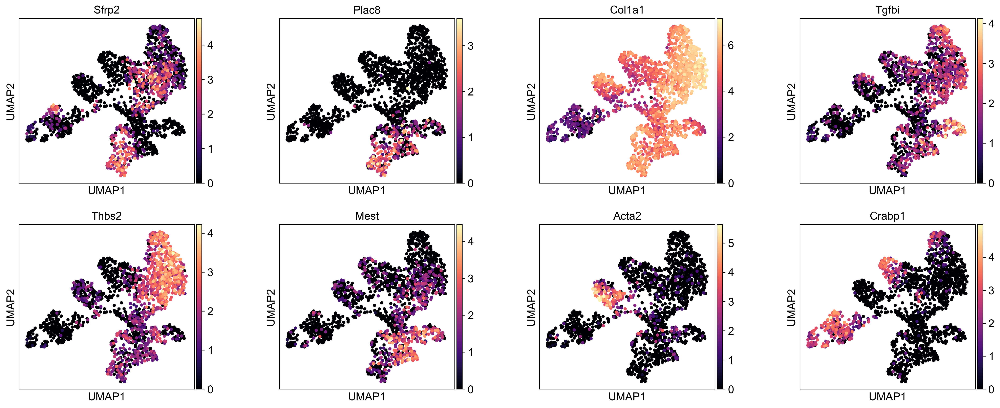

In [49]:
sc.pl.umap(adata_subset, color=['Sfrp2','Plac8','Col1a1','Tgfbi','Thbs2',
                               'Mest','Acta2','Crabp1'], 
           color_map= 'magma',
           wspace=0.35)

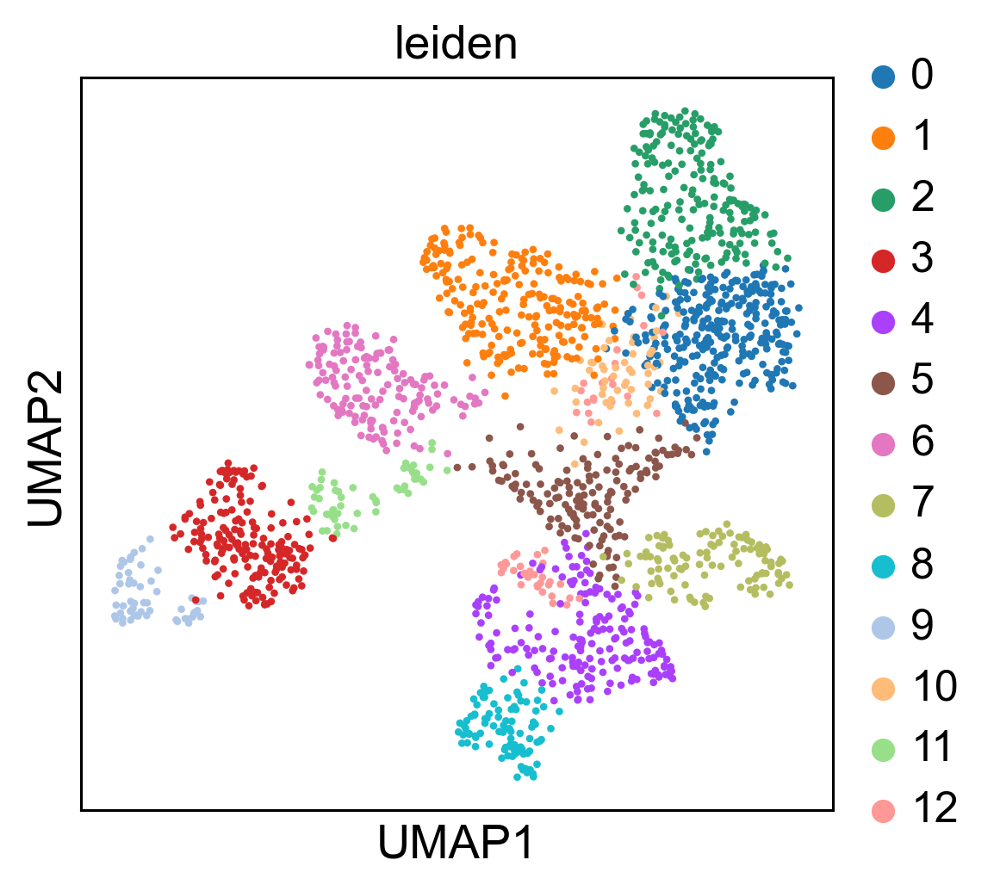

In [50]:
sc.pl.umap(adata_subset, color=['leiden'], legend_loc='right margin', wspace=0.5, size=20)

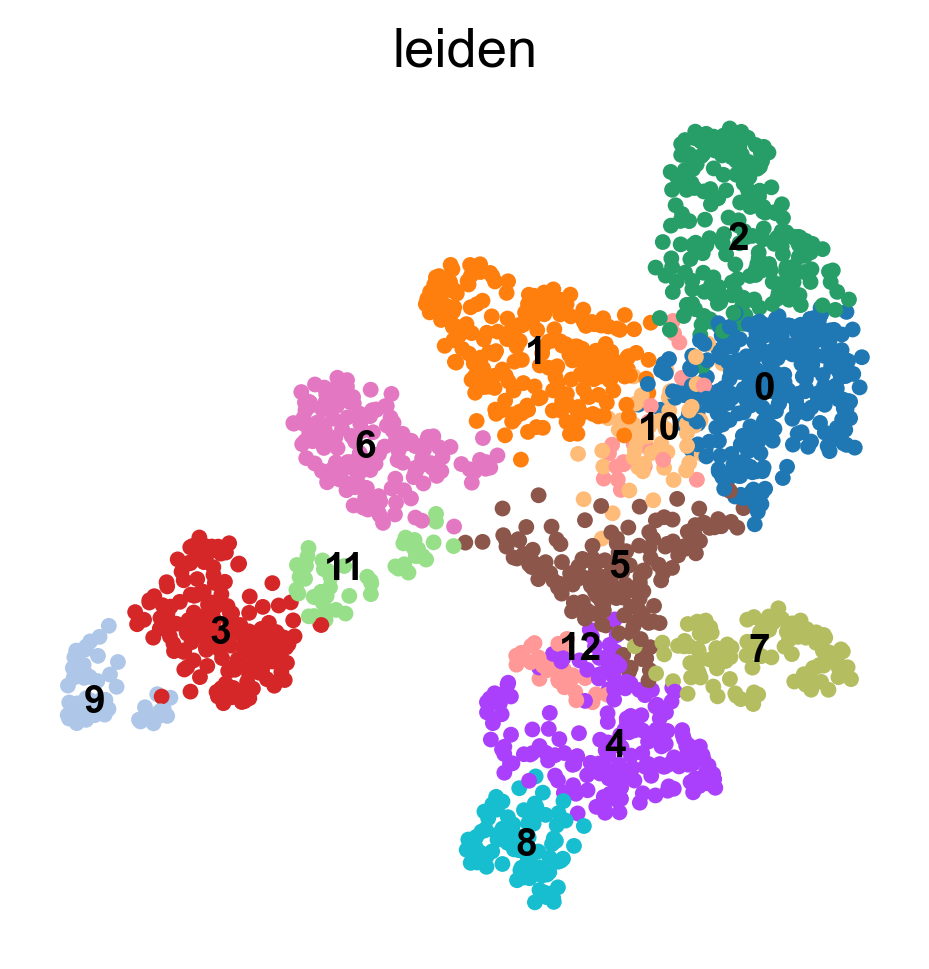

In [51]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', legend_fontsize='10.0',
           frameon=False)

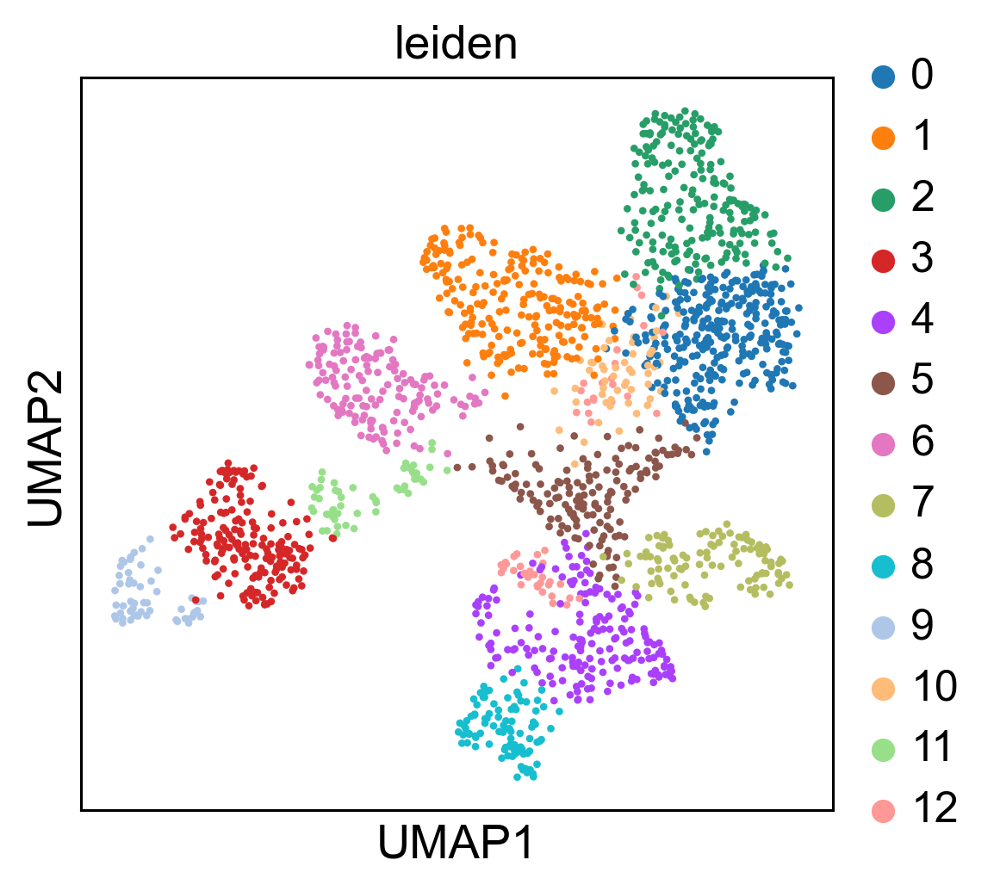

In [52]:
sc.pl.umap(adata_subset, color=['leiden'], legend_loc='right margin', wspace=0.5, size=20)

In [53]:
###COLORING THE TIME PLOT####

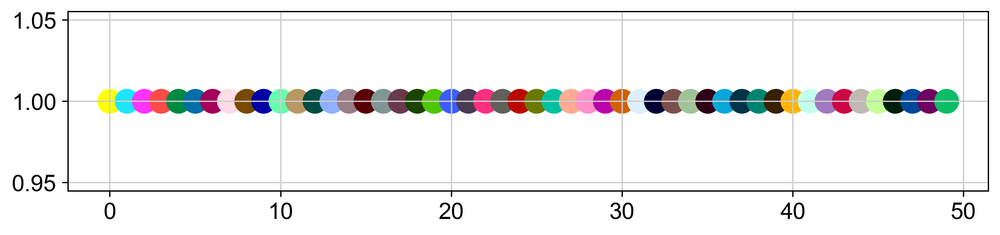

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
pl.figure(figsize=(10, 2))
for i in range(50):
    pl.scatter(i, 1, c=sc.pl.palettes.godsnot_102[i], s=200)
pl.show()

In [55]:
default_colors = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(adata_subset.uns['leiden_colors'])

In [56]:
new_colors[[0]] = default_colors[[40]]  # 'LWC14dpwPNeg'
new_colors[[1]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[2]] = default_colors[[6]]  #  'LWC14dpwPos'
new_colors[[3]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[4]] = default_colors[[8]]  #  'LWC14dpwPos'
new_colors[[5]] = default_colors[[40]]  #  'LWC14dpwPos'
new_colors[[6]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[7]] = default_colors[[6]]  #  'LWC14dpwPos'
new_colors[[8]] = default_colors[[30]]  #  'LWC14dpwPos'
new_colors[[9]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[10]] = default_colors[[40]]  #  'LWC14dpwPos'
new_colors[[11]] = default_colors[[47]]  #  'LWC14dpwPos'
new_colors[[12]] = default_colors[[8]]  #  'LWC14dpwPos'


In [57]:
adata_subset.uns['leiden_colors'] = new_colors

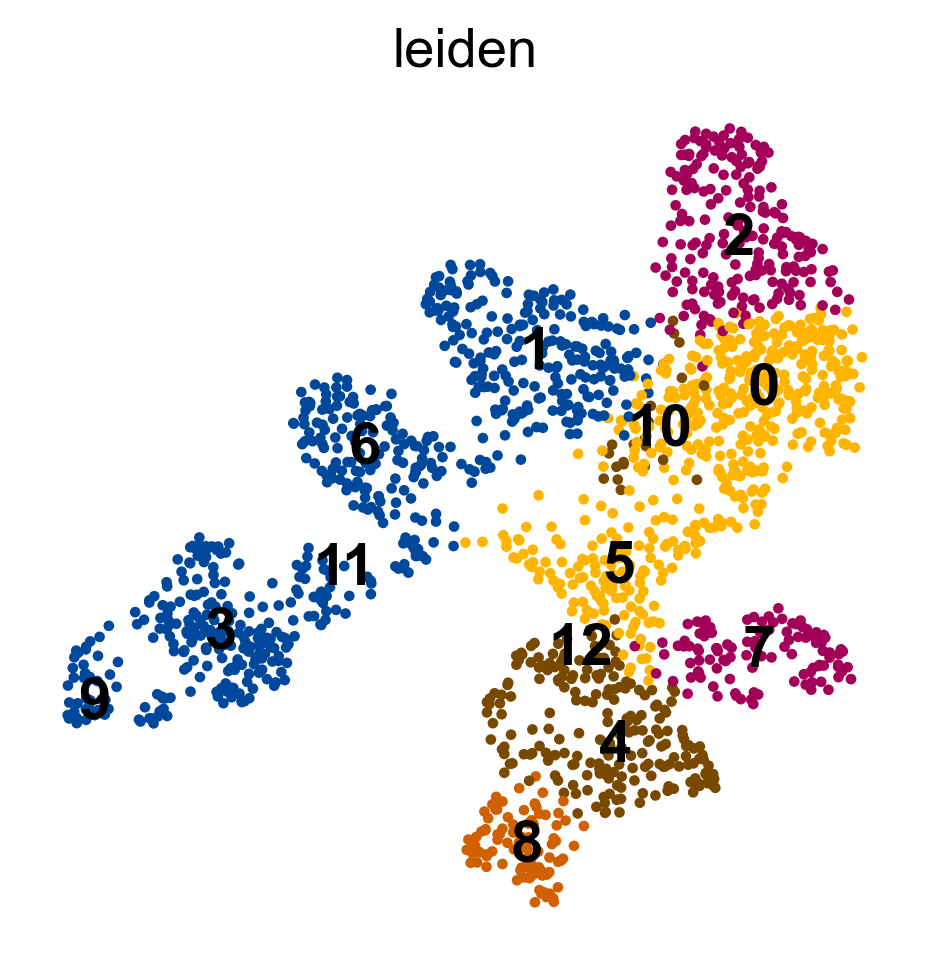

In [58]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', legend_fontsize='15.0',
           frameon=False, size=30)

In [59]:
adata_subset.obs.groupby(["leiden"]).apply(len)

leiden
0     300
1     226
2     203
3     183
4     182
5     151
6     149
7     108
8      95
9      57
10     55
11     53
12     52
dtype: int64

In [60]:
#ALLdata = pd.DataFrame(adata.obs.groupby(["louvain","batch"]).apply(len))

In [61]:
#ALLdata.to_csv('/home/driskelllab/Desktop/allcells.csv')

In [62]:
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.1 (python 3.7.6) on 2020-10-16 10:02.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [63]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [64]:
adata_subset

AnnData object with n_obs × n_vars = 1814 × 1941
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'batch_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

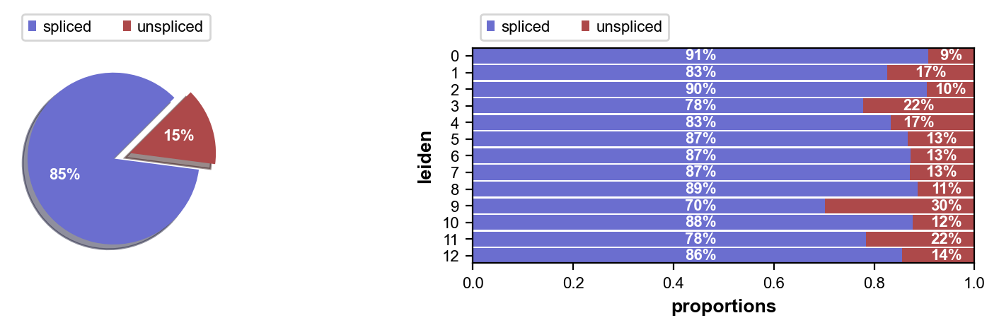

In [65]:
scv.pl.proportions(adata_subset, groupby='leiden')

In [66]:
scv.pp.filter_and_normalize(adata_subset, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata_subset, n_pcs=30, n_neighbors=30)

Filtered out 1183 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [67]:
scv.tl.velocity(adata_subset)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [68]:
scv.tl.velocity_graph(adata_subset)

computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


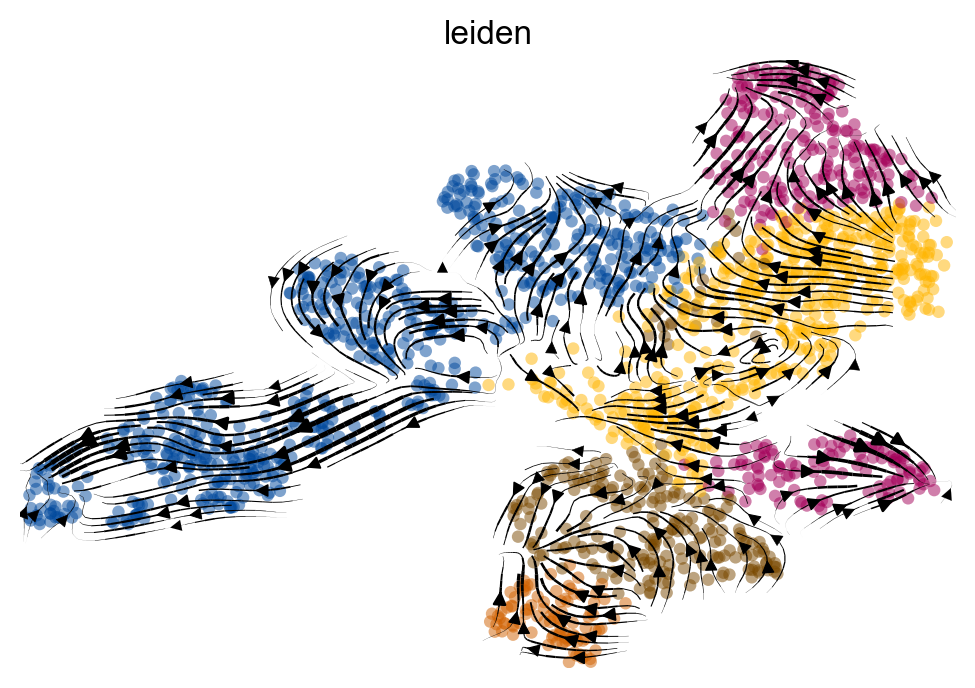

In [69]:
scv.pl.velocity_embedding_stream(adata_subset, basis='umap', 
                                 color=['leiden'],
                                legend_loc='none', alpha=0.5, size=80,
                                density=1.5)

In [71]:
scv.tl.rank_velocity_genes(adata_subset, groupby='leiden', n_genes=1000)

df = scv.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])
df.head(50000)

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,Nfia,Tbx15,Sema3a,Gm17501,Tshz2,Gas7,Ntrk3,Anxa2,Adgrd1,Sorbs1,Hacd2,Corin,Piezo2
1,Phldb2,Itga8,Col3a1,Brdt,Sulf1,Flrt2,Rasgrp2,Col4a2,Meg3,Wif1,Adamts17,Lamc3,Plat
2,Heg1,Pde3a,Pid1,Ptprz1,Zfhx4,Adam12,Tns3,Akap12,Gfpt2,Ptger3,C1qtnf3,Coch,Col5a3
3,Cd34,Trps1,Phldb2,Prex2,Pde10a,Tnfaip6,Gas7,Cp,Cyp1b1,Hoxa9,Ltbp2,Spon1,Col8a1
4,Mmp2,Apela,Meox2,Hhip,Pou2f2,Ldb2,Pcdh9,Sobp,Rorb,Fli1,Ctsc,Fli1,Zfhx4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,Cd302,Cp,Itga8,Col4a1,Mmp2,Rspo3,Thsd7a,Col5a3,Tbx15,Meg3,Fbln5,Art3,Tns3
227,Sorbs1,Meg3,Gfra1,St3gal4,Tbx15,Cyp1b1,Ldb2,Scarb1,Lhfpl2,Col14a1,Gpm6b,Ugcg,Meg3
228,Gfra1,Mirg,Zfhx4,Nfia,Thsd7a,Bcl2,Itga9,Phldb2,Icam1,Soat1,Soat1,Nfia,Thy1
229,Anxa2,Ldb2,Sorbs1,Pid1,Svep1,Piezo2,Dpep1,Arpc1b,Trps1,Col4a1,Col1a2,Fxyd1,Itga11
